#### Data description

Overall, the dataset appears to provide a comprehensive view of sales transactions, 
with the potential for analysis at multiple levels, including by:
1- product
2- customer
3- location.

Year: This column represents the year in which the transaction occurred. 
It could be used to track trends over time or to filter the data based on a specific year or range of years.

Month: This column represents the month in which the transaction occurred. 
It could be used to track trends over time or to filter the data based on a specific month or range of months.

Customer Age: This column represents the age of the customer.
 It could be used to segment customers based on age ranges or to analyze the purchasing behavior of different age groups.

Customer Gender: This column represents the gender of the customer. 
It could be used to segment customers based on gender or to analyze the purchasing behavior of different genders.

Country: This column represents the country where the transaction occurred. 
It could be used to analyze sales by country or to filter the data based on a specific country or range of countries.

State: This column represents the state where the transaction occurred.
 It could be used to analyze sales by the state or to filter the data based on a specific state or range of states.

Product Category: This column represents the broad category of the product sold. 
It could be used to analyze sales by product category or to filter the data based on a specific product category.

Sub Category: This column represents the specific subcategory of the product sold. 
It could be used to analyze sales by subcategory or to filter the data based on a specific subcategory.

Quantity: This column represents the quantity of the product sold. 
It could be used to analyze sales volume or to calculate the total revenue generated from a particular product or product category.

Unit Cost: This column represents the cost of producing or acquiring one unit of the product. 
It could be used to calculate profit margins or to compare the costs of different products or product categories.

Unit Price: This column represents the price at which one unit of the product was sold. 
It could be used to analyze pricing strategies or to compare the prices of different products or product categories.

Cost: This column represents the total cost of the products sold, which is calculated as the product of the quantity and the unit cost. 
It could be used to analyze the cost structure of the business or to calculate the profit margin of each sale.

Revenue: This column represents the total revenue generated by the sales, which is calculated as the product of the quantity and the unit price. 
It could be used to analyze the overall sales performance of the business or to calculate the profit generated by each sale.

In [1]:
import pandas as pd 

import seaborn as sns 
import plotly.express as px
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("../data/raw/salesforcourse-4fe2kehu.csv")

In [3]:
df_copy =df.copy()

In [4]:
df_copy.head()

,index,Date,Year,Month,Customer Age,Customer Gender,Country,State,Product Category,Sub Category,Quantity,Unit Cost,Unit Price,Cost,Revenue
0,0,2/19/2016,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0
1,1,2/20/2016,2016.0,February,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0
2,2,2/27/2016,2016.0,February,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0
3,3,03-12-16,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0
4,4,03-12-16,2016.0,March,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0


In [5]:
## Renaming dataframe headers

df_copy.columns=df_copy.columns.str.lower().str.replace(" ","_")

In [6]:
df_copy.tail()

,index,date,year,month,customer_age,customer_gender,country,state,product_category,sub_category,quantity,unit_cost,unit_price,cost,revenue
34862,34862,02-07-16,2016.0,February,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,2.0,1160.0,985.500000,2320.0,1971.000000
34863,34863,3/13/2015,2015.0,March,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2049.0,1583.000000,2049.0,1583.000000
34864,34864,04-05-15,2015.0,April,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,3.0,683.0,560.666667,2049.0,1682.000000
34865,34865,8/30/2015,2015.0,August,38.0,M,France,Hauts de Seine,Bikes,Mountain Bikes,1.0,2320.0,1568.000000,2320.0,1568.000000
34866,34866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,641.532095


In [7]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34867 entries, 0 to 34866
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             34867 non-null  int64  
 1   date              34866 non-null  object 
 2   year              34866 non-null  float64
 3   month             34866 non-null  object 
 4   customer_age      34866 non-null  float64
 5   customer_gender   34866 non-null  object 
 6   country           34866 non-null  object 
 7   state             34866 non-null  object 
 8   product_category  34866 non-null  object 
 9   sub_category      34866 non-null  object 
 10  quantity          34866 non-null  float64
 11  unit_cost         34866 non-null  float64
 12  unit_price        34866 non-null  float64
 13  cost              34866 non-null  float64
 14  revenue           34867 non-null  float64
dtypes: float64(7), int64(1), object(7)
memory usage: 4.0+ MB


### Check missing values

In [8]:
df_copy.isna().sum() ## There is one missing value

index               0
date                1
year                1
month               1
customer_age        1
customer_gender     1
country             1
state               1
product_category    1
sub_category        1
quantity            1
unit_cost           1
unit_price          1
cost                1
revenue             0
dtype: int64

In [9]:
df_copy.dropna(axis=0,inplace=True) ## Drop missing values

In [10]:
df_copy.isna().sum()

index               0
date                0
year                0
month               0
customer_age        0
customer_gender     0
country             0
state               0
product_category    0
sub_category        0
quantity            0
unit_cost           0
unit_price          0
cost                0
revenue             0
dtype: int64

### Check duplicate values

In [11]:
df_copy.duplicated().sum() ## There is no duplicate values

0

### Drop index column 

In [12]:
df_copy.drop('index',axis=1,inplace=True) 

### Show descriptive statistics of data 

In [13]:
df_copy.describe() ## numerical values

,year,customer_age,quantity,unit_cost,unit_price,cost,revenue
count,34866.000000,34866.000000,34866.000000,34866.000000,34866.000000,34866.000000,34866.000000
mean,2015.569237,36.382895,2.002524,349.880567,389.232485,576.004532,640.870074
std,0.495190,11.112902,0.813936,490.015846,525.319091,690.500395,736.650597
min,2015.000000,17.000000,1.000000,0.670000,0.666667,2.000000,2.000000
25%,2015.000000,28.000000,1.000000,45.000000,53.666667,85.000000,102.000000
50%,2016.000000,35.000000,2.000000,150.000000,179.000000,261.000000,319.000000
75%,2016.000000,44.000000,3.000000,455.000000,521.000000,769.000000,902.000000
max,2016.000000,87.000000,3.000000,3240.000000,5082.000000,3600.000000,5082.000000


### Here are shown of  each column of data :
- the count 
- standard deviation 
- minimum 
- maximum 
- mean 
- the quartiles Q1,Q2 and Q3  where:
  -   25% percentile : 25% of the values are less than the given percentile
  -   50% percentile : 50% of the values are less than the given percentile
  -   75% percentile : 75% of the values are less than the given percentile

In [14]:
df_copy.describe(include='O') ## date and string values 

,date,month,customer_gender,country,state,product_category,sub_category
count,34866,34866,34866,34866,34866,34866,34866
unique,576,12,2,4,45,3,17
top,03-01-16,June,M,United States,California,Accessories,Tires and Tubes
freq,196,3680,17805,18076,10332,22534,11112


#### Here are also the string and datetime data We got the count , the number of unique data , top (the most frequest value), and its frequency for each column (freq). The first and last appear with datatime data type only which are the first date and last date ordered values.

- The most frequent month in data is June 
- The most frequent country is United States with state California
- The most frquest product category is accessories with subcategory Tires and  tubes

### Check features values

In [15]:
df_copy.country.value_counts()

United States     18076
United Kingdom     6421
Germany            5201
France             5168
Name: country, dtype: int64

In [16]:
df_copy.state.value_counts()

California             10332
England                 6421
Washington              5204
Oregon                  2446
Saarland                1287
Nordrhein-Westfalen     1171
Hessen                  1112
Seine (Paris)           1092
Hamburg                  869
Seine Saint Denis        796
Nord                     787
Bayern                   668
Hauts de Seine           509
Essonne                  465
Yveline                  442
Seine et Marne           183
Moselle                  181
Loiret                   178
Val d'Oise               130
Garonne (Haute)          100
Brandenburg               94
Val de Marne              75
Charente-Maritime         70
Somme                     61
Loir et Cher              57
Pas de Calais             42
Illinois                  14
Texas                     14
Ohio                      13
New York                  10
Florida                    7
South Carolina             5
Utah                       5
Kentucky                   4
Wyoming       

In [17]:
# list_of_counts=df_copy['state'].value_counts().to_list();
# list_of_states=df_copy['state'].value_counts().index

# removed_states=[]
# for i,v in enumerate(list_of_counts):
#     if(v<10):
#       removed_states.append(list_of_states[i])
        
        

In [18]:
# removed_states

In [19]:
# for state in removed_states:
#     index=df_copy[df_copy['state'] == state].index
#     df_copy.drop(index,axis=0,inplace=True)

In [20]:
# df_copy['state'].value_counts()

In [21]:
df_copy.shape

(34866, 14)

In [22]:
df_copy.year.value_counts()

2016.0    19847
2015.0    15019
Name: year, dtype: int64

In [23]:
df_copy.product_category.value_counts()

Accessories    22534
Bikes           7093
Clothing        5239
Name: product_category, dtype: int64

In [24]:
df_copy.groupby("product_category")['sub_category'].value_counts()

product_category  sub_category     
Accessories       Tires and Tubes      11112
                  Bottles and Cages     5295
                  Helmets               4176
                  Fenders                762
                  Cleaners               545
                  Hydration Packs        396
                  Bike Stands            145
                  Bike Racks             103
Bikes             Road Bikes            3022
                  Mountain Bikes        2737
                  Touring Bikes         1334
Clothing          Jerseys               2000
                  Caps                  1517
                  Shorts                 566
                  Gloves                 480
                  Socks                  364
                  Vests                  312
Name: sub_category, dtype: int64

### Feature Engineering

In [25]:
df_copy['date'].value_counts()

03-01-16     196
6/14/2016    172
4/19/2016    171
2/20/2016    162
6/28/2016    149
            ... 
2/23/2015      1
3/27/2015      1
5/18/2015      1
04-10-15       1
02-07-15       1
Name: date, Length: 576, dtype: int64

In [26]:
df_copy['date'] = pd.to_datetime(df_copy['date'])

In [27]:
df_copy['date'].value_counts()

2016-03-01    196
2016-06-14    172
2016-04-19    171
2016-02-20    162
2016-06-28    149
             ... 
2015-02-23      1
2015-03-27      1
2015-05-18      1
2015-04-10      1
2015-02-07      1
Name: date, Length: 576, dtype: int64

In [28]:
df_copy['day_name'] = df_copy.date.dt.day_name()
df_copy['day_of_week'] = df_copy.date.dt.day_of_week
df_copy['day']=df_copy['date'].dt.day
df_copy['hour']=df_copy['date'].dt.hour
df_copy['month_name']=df_copy['date'].dt.month_name()
df_copy['month']=df_copy['date'].dt.month

In [29]:
## Feature engineering, get Season feature from Month feature

## Map months to Seasons 
def map_months(x):
    if x in [12, 1, 2]:
        return 'Winter'
    elif x in [3, 4, 5]:
        return 'Spring'
    elif x in [6, 7, 8]:
        return 'Summer'
    elif x in [9, 10, 11]:
        return 'Autumn'

df_copy['season'] = df_copy['month'].apply(map_months)
df_copy.head()

,date,year,month,customer_age,customer_gender,country,state,product_category,sub_category,quantity,unit_cost,unit_price,cost,revenue,day_name,day_of_week,day,hour,month_name,season
0,2016-02-19,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,80.00,109.000000,80.0,109.0,Friday,4,19,0,February,Winter
1,2016-02-20,2016.0,2,29.0,F,United States,Washington,Clothing,Gloves,2.0,24.50,28.500000,49.0,57.0,Saturday,5,20,0,February,Winter
2,2016-02-27,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,3.67,5.000000,11.0,15.0,Saturday,5,27,0,February,Winter
3,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,87.50,116.500000,175.0,233.0,Saturday,5,12,0,March,Spring
4,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,35.00,41.666667,105.0,125.0,Saturday,5,12,0,March,Spring


In [30]:
'''
Feature engineering, get Period feature from Hour feature where: 
Early morning from 5 AM to 10 AM
Late morning from 11 AM to 12 PM
Afternoon from 1 PM (13) to 5 (17) PM
Early evening from 6 PM (18) to 8 PM (20)
Late evening from 9 PM (21) to 11 PM (23)
Night from 12 AM to 4 AM

'''
## Map hours to periods 
def map_hours(x):
    if x in range(21,24):
        return 'Late evening (21-00)'
    elif x in range(0, 5):
        return 'Night (00-5)'
    elif x in range(5, 11):
        return 'Early morning (5-11)'
    elif x in range(11, 13):
        return 'Late morning (11-12)'
    elif x in range(13, 18):
        return 'Afternoon'
    elif x in range(18, 21):
        return 'Early evening (18-21)'
    
df_copy['period'] = df_copy['hour'].apply(map_hours)
df_copy.head()

,date,year,month,customer_age,customer_gender,country,state,product_category,sub_category,quantity,...,unit_price,cost,revenue,day_name,day_of_week,day,hour,month_name,season,period
0,2016-02-19,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,...,109.000000,80.0,109.0,Friday,4,19,0,February,Winter,Night (00-5)
1,2016-02-20,2016.0,2,29.0,F,United States,Washington,Clothing,Gloves,2.0,...,28.500000,49.0,57.0,Saturday,5,20,0,February,Winter,Night (00-5)
2,2016-02-27,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,...,5.000000,11.0,15.0,Saturday,5,27,0,February,Winter,Night (00-5)
3,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,...,116.500000,175.0,233.0,Saturday,5,12,0,March,Spring,Night (00-5)
4,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,...,41.666667,105.0,125.0,Saturday,5,12,0,March,Spring,Night (00-5)


In [31]:
# Calculate profit for each product
df_copy['profit'] = df_copy['revenue'] - df_copy['cost']
# Calculate profit margin for each product
df_copy['profit_margin'] = df_copy['profit'] / df_copy['revenue']

In [32]:
df_copy.head()

,date,year,month,customer_age,customer_gender,country,state,product_category,sub_category,quantity,...,revenue,day_name,day_of_week,day,hour,month_name,season,period,profit,profit_margin
0,2016-02-19,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,1.0,...,109.0,Friday,4,19,0,February,Winter,Night (00-5),29.0,0.266055
1,2016-02-20,2016.0,2,29.0,F,United States,Washington,Clothing,Gloves,2.0,...,57.0,Saturday,5,20,0,February,Winter,Night (00-5),8.0,0.140351
2,2016-02-27,2016.0,2,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,...,15.0,Saturday,5,27,0,February,Winter,Night (00-5),4.0,0.266667
3,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,2.0,...,233.0,Saturday,5,12,0,March,Spring,Night (00-5),58.0,0.248927
4,2016-03-12,2016.0,3,29.0,F,United States,Washington,Accessories,Tires and Tubes,3.0,...,125.0,Saturday,5,12,0,March,Spring,Night (00-5),20.0,0.160000


### Dealing with Outliers 

In [33]:
## Selecting numerical columns to check outliers
numerical_columns=df_copy.select_dtypes(include='float64')

In [34]:
numerical_columns

,year,customer_age,quantity,unit_cost,unit_price,cost,revenue,profit,profit_margin
0,2016.0,29.0,1.0,80.00,109.000000,80.0,109.0,29.0,0.266055
1,2016.0,29.0,2.0,24.50,28.500000,49.0,57.0,8.0,0.140351
2,2016.0,29.0,3.0,3.67,5.000000,11.0,15.0,4.0,0.266667
3,2016.0,29.0,2.0,87.50,116.500000,175.0,233.0,58.0,0.248927
4,2016.0,29.0,3.0,35.00,41.666667,105.0,125.0,20.0,0.160000
...,...,...,...,...,...,...,...,...,...
34861,2015.0,38.0,1.0,2049.00,1487.000000,2049.0,1487.0,-562.0,-0.377942
34862,2016.0,38.0,2.0,1160.00,985.500000,2320.0,1971.0,-349.0,-0.177067
34863,2015.0,38.0,1.0,2049.00,1583.000000,2049.0,1583.0,-466.0,-0.294378
34864,2015.0,38.0,3.0,683.00,560.666667,2049.0,1682.0,-367.0,-0.218193


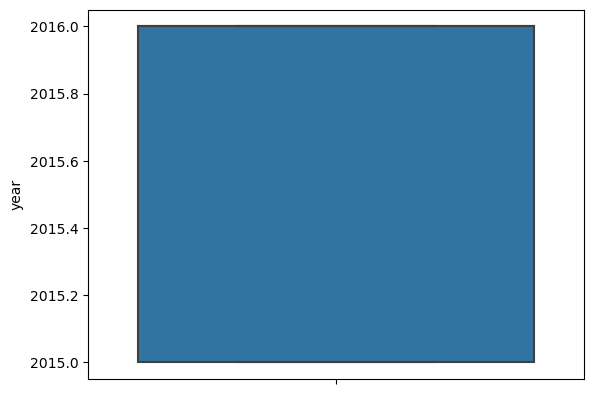

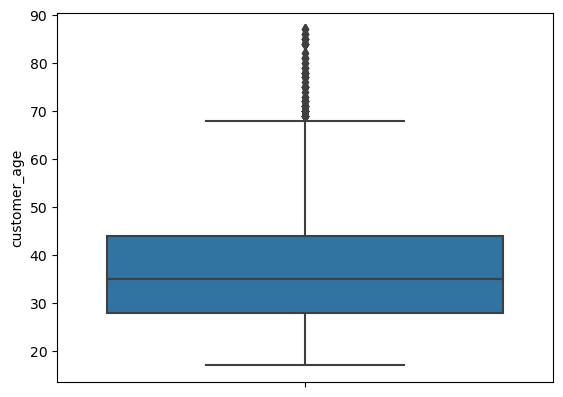

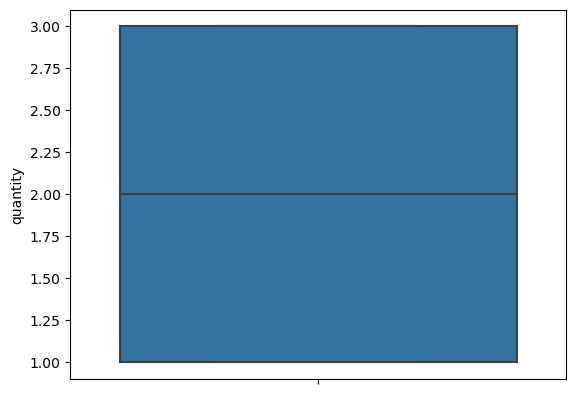

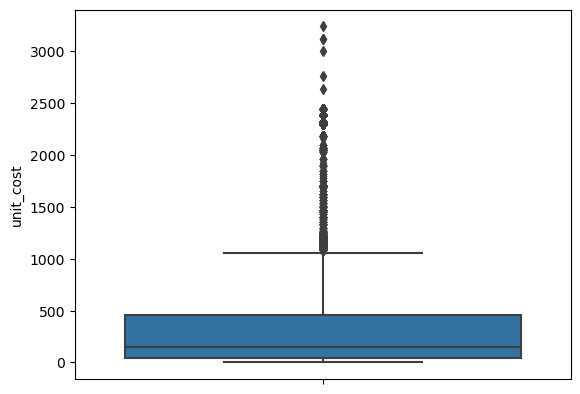

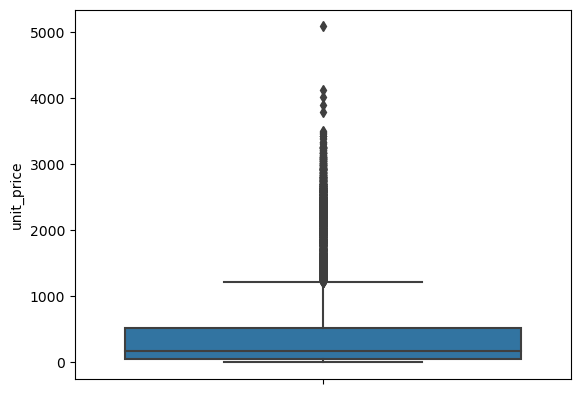

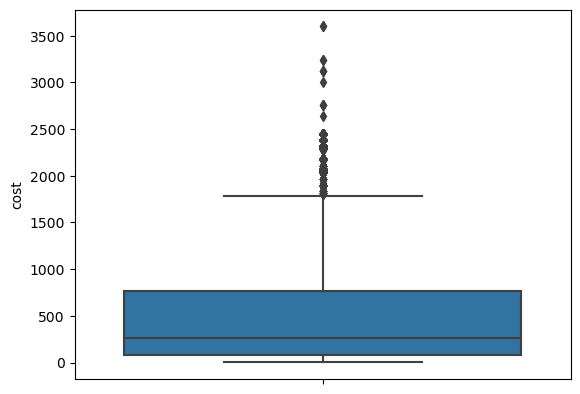

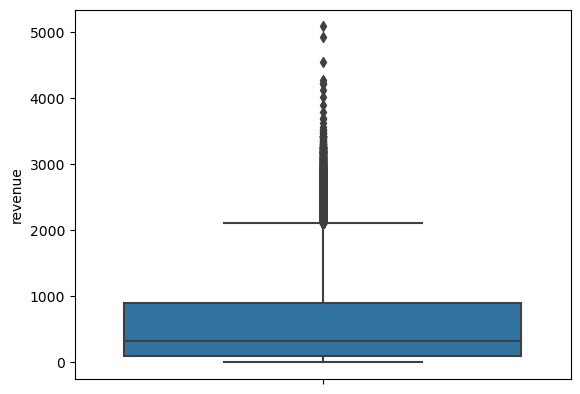

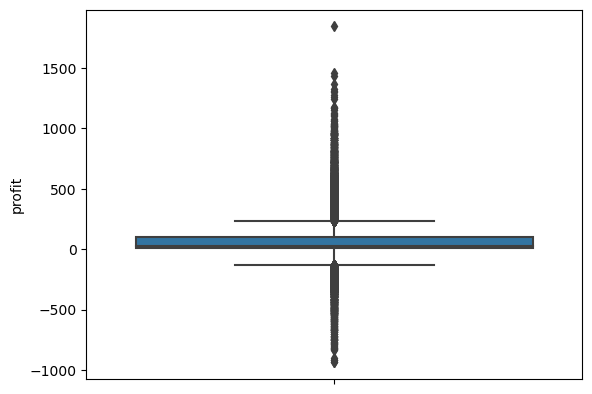

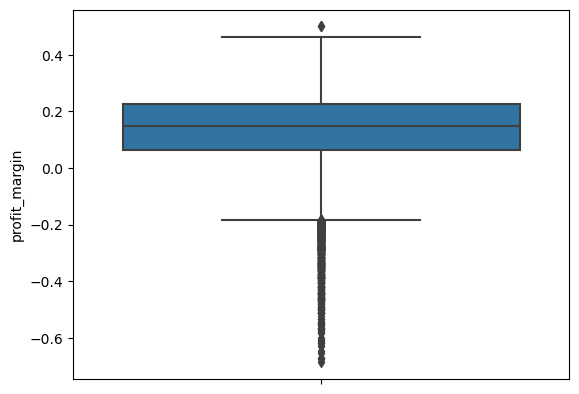

In [35]:
## Box plot for each numerical columns to check outliers
for column in numerical_columns:

    sns.boxplot(data=df_copy,y=column)
    plt.show()

### We can say that the outliers values are acceptable

Questions to answer: 
1- What are the most product category and subcategory that affect profit ? 
2- Which customers affect profit more females or males? 
3- Which is the country of most profit?
4- What is the year and month of most profit?
5- What is the correlation between features and target?

### Analysis

<AxesSubplot:xlabel='customer_gender', ylabel='count'>

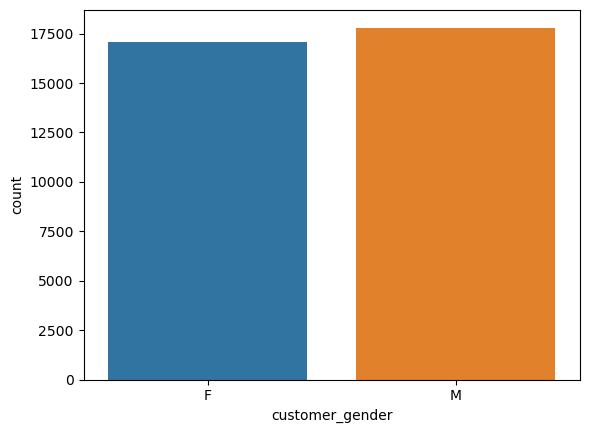

In [36]:
sns.countplot(data=df_copy,x='customer_gender')

### Males in the dataset are more than females

<AxesSubplot:xlabel='country', ylabel='count'>

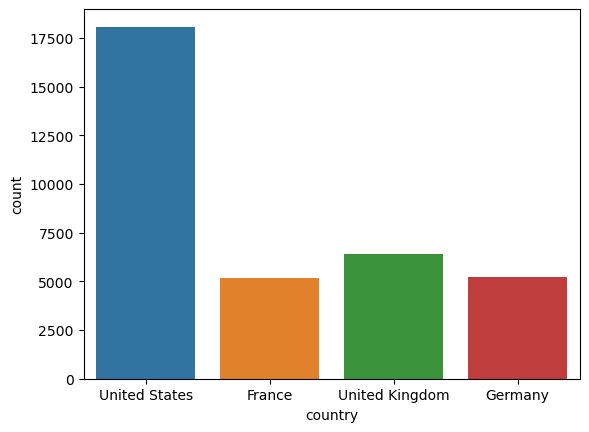

In [37]:
sns.countplot(data=df_copy,x='country')

### United States is the most found then United Kingdom then Germany then France.

<AxesSubplot:xlabel='count', ylabel='state'>

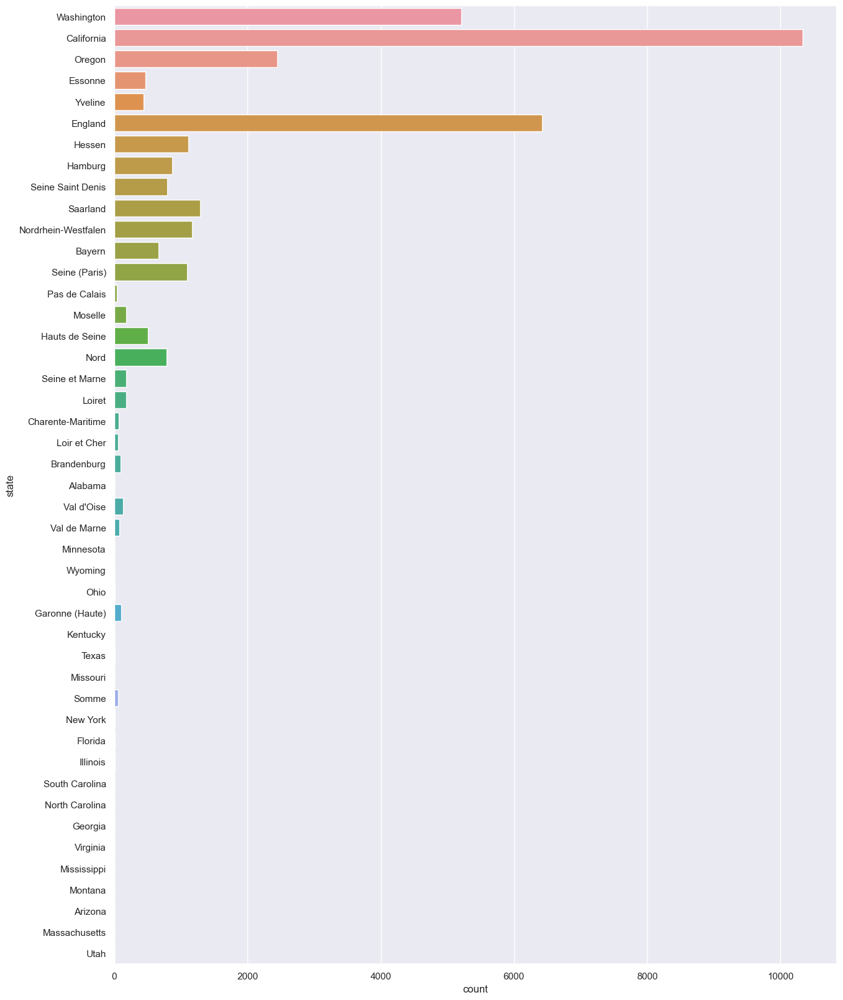

In [38]:
sns.set(rc={"figure.figsize":(15, 20)})
sns.countplot(data=df_copy,y='state')


### The most found state in the dataset is California then England then Washington

<AxesSubplot:xlabel='count', ylabel='customer_age'>

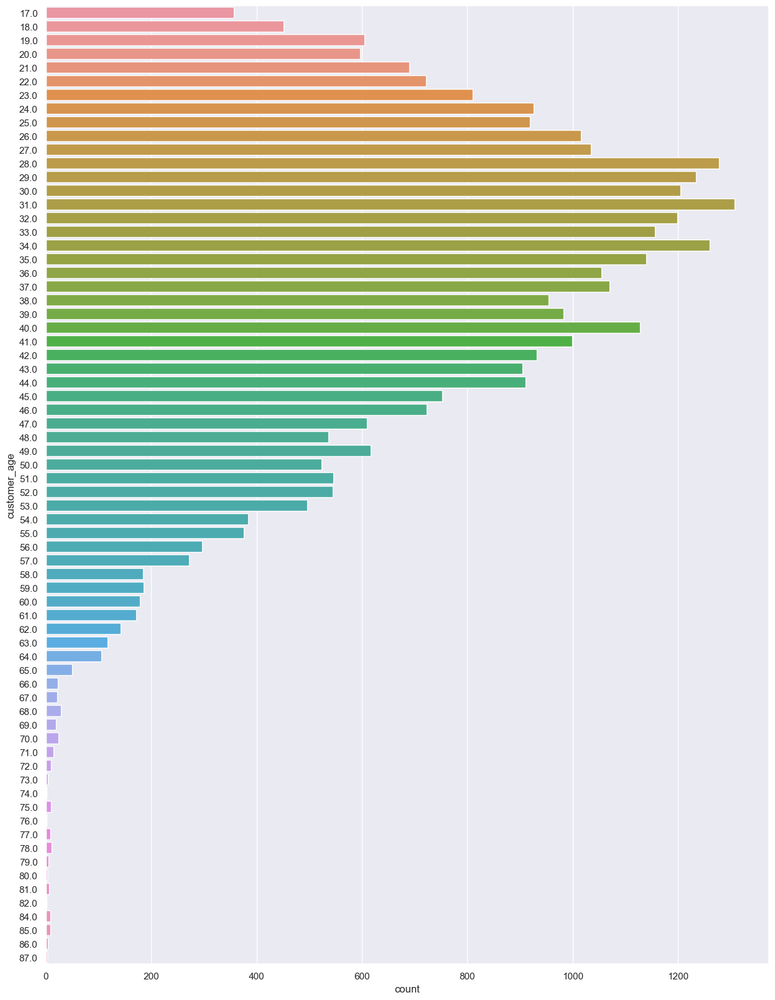

In [39]:
sns.countplot(data=df_copy,y='customer_age')

The most found age is 31 then 28 

In [40]:
fig = px.histogram(df_copy,x='year',color_discrete_sequence = ['purple'])
fig.show()

The year 2016 is the most found.

In [41]:
fig = px.histogram(df_copy,x='cost',color_discrete_sequence = ['purple'])
fig.show()

The most common costs are less 50 price unit.

<AxesSubplot:xlabel='season', ylabel='count'>

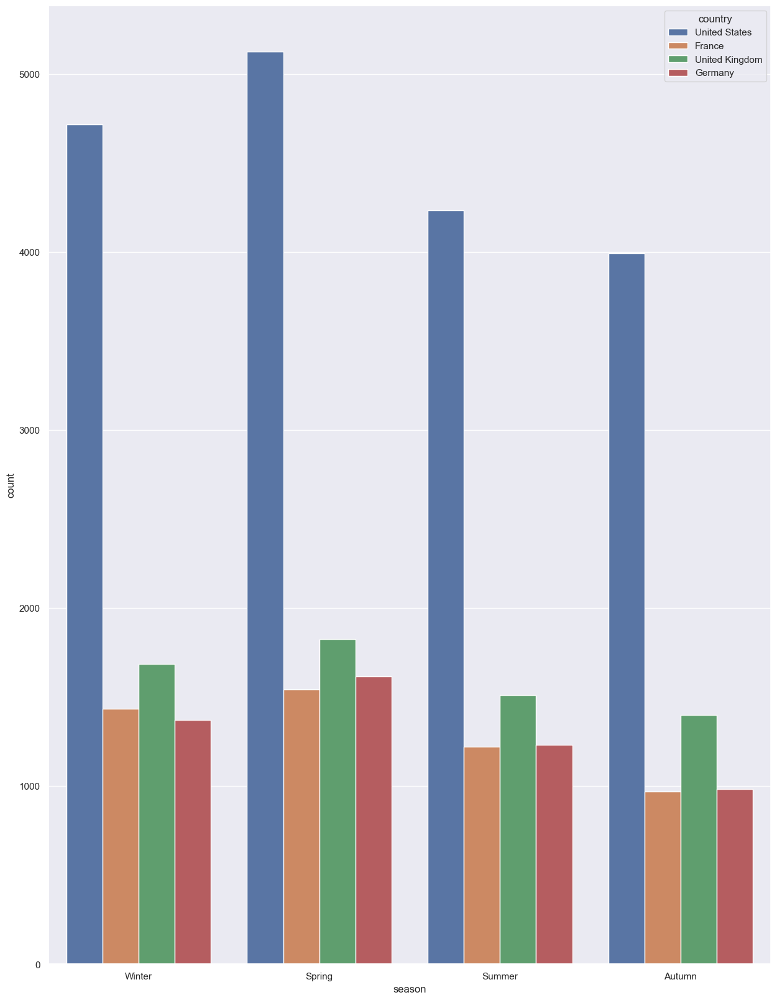

In [42]:
sns.countplot(data=df_copy,x='season',hue='country')

The most common season in data is spring

In [42]:
px.histogram(data_frame=df_copy,y='profit',x= 'state',color='customer_gender')

### It appears that males have more effect on profit than females in general

In [43]:
px.histogram(data_frame=df_copy,x='country',y='profit',color='customer_gender')

### In United states and United Kingdom the males leads to higher profits than females ,but in Germany and France , females affect the profit more than males.

In [44]:
px.histogram(data_frame=df_copy,x='customer_age',y='profit',color='country',facet_col='customer_gender')

### - The customers of ages from 30 to 42 have more effect on profit in general in all countries.But, in Germany it is a wider range from 24 to 44 

In [45]:
df_copy_sorted=df_copy.sort_values(by='month')
px.histogram(data_frame=df_copy,x='month_name',y='profit',color='customer_gender',facet_col='country')

It appears that the most transactions in general have been:
- In both United states and Germany  in <b>May</b> by both males and females. 
- In France, in <b>April</b> by both males and females..
- In United Kingdom, in <b>June</b> by both males and females..
- In United States , <b>females</b> affect the profit more in <b>May</b> while males in <b>June</b>. 
- In France, <b>females</b> affect the profit more in <b>May</b> while males in <b>June</b>. 
- In United Kingdom, <b>females</b> affect the profit more in <b>June</b> while males in <b>April</b>. 
- In Germany, <b>females</b> affect the profit more in <b>April</b> while males in <b>May</b>. 

- In general in all countries April , May and June.


In [46]:
df_copy['year_string']=df_copy['year'].apply(lambda x : str(x))

In [47]:
px.histogram(data_frame=df_copy,x='year_string',y='profit',color='customer_gender',facet_col='country')

### In general there are more sales transactions in 2016 than 2015 

In [48]:
px.histogram(data_frame=df_copy,x='product_category',y='profit',color='sub_category',barmode='group')

- The most category that has effect on profit in Accessories category with subcategories helmets then tires and tubes 
- Then , in clothing category, the most effective subcategories are jerseys then shorts 
- Then , in Bikes category ,the most effective subcategory on profit is mountain bikes then touring bikes

In [49]:
px.histogram(data_frame=df_copy,x='sub_category',y='profit',color='customer_gender',facet_col='country')

The most subcategory that affects profit:
-  In United States is tires and tubes (Accessories)
-  In France and United Kingdom is Helmets (Accessories)
-  In Germany is Mountain Bikes (Bikes)

In [50]:
df_copy['month_string'] = df_copy['month'].apply(lambda x: str(x))
df_copy['year_month'] = df_copy['year_string']+"-"+df_copy['month_string']

In [51]:
df_copy.groupby('country')['profit'].sum()

country
France            272657.0
Germany           958825.0
United Kingdom    328955.0
United States     699871.0
Name: profit, dtype: float64

In [52]:
df_copy.groupby('country')['profit'].mean()

country
France             52.758707
Germany           184.353970
United Kingdom     51.231117
United States      38.810570
Name: profit, dtype: float64

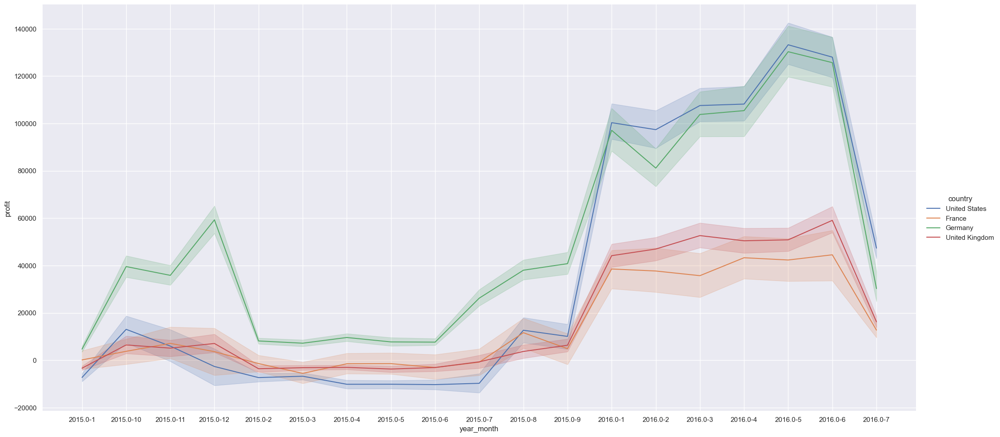

In [53]:
df_copy_sorted=df_copy.sort_values(by='year_month')
sns.relplot(data=df_copy_sorted, x="year_month", y="profit", kind="line", height =10, aspect = 2.1, hue="country",estimator='sum')

- As appears the profit increases in 2016 year than 2015 in general. 
- Germany achieves the highest profits in 2015 while United States achieves the highest in  2016.
- The lowest profits in 2015 is the United States while the lowest in 2016 is France. 
- The highest month in Germany in 2015 is December. The lowest is January.
- United Kingdom profits are better than France in general.


In [54]:
px.density_heatmap(df_copy,x= 'season',y='profit')
#fig.update_layout(width=1500,height=1000)

### The best season in general for profit is Spring

In [55]:
px.strip(x='season', y='profit', data_frame =df_copy,color='country')

### The best season in general for profit is Spring

In [56]:
df_sorted=df_copy.sort_values(by="cost")
px.line(x='cost', y='profit', data_frame =df_sorted)

### By this , it appears that cost doesn't have effect on profit , as some products have higher costs but with lower profit and some of lower costs and higher profits 

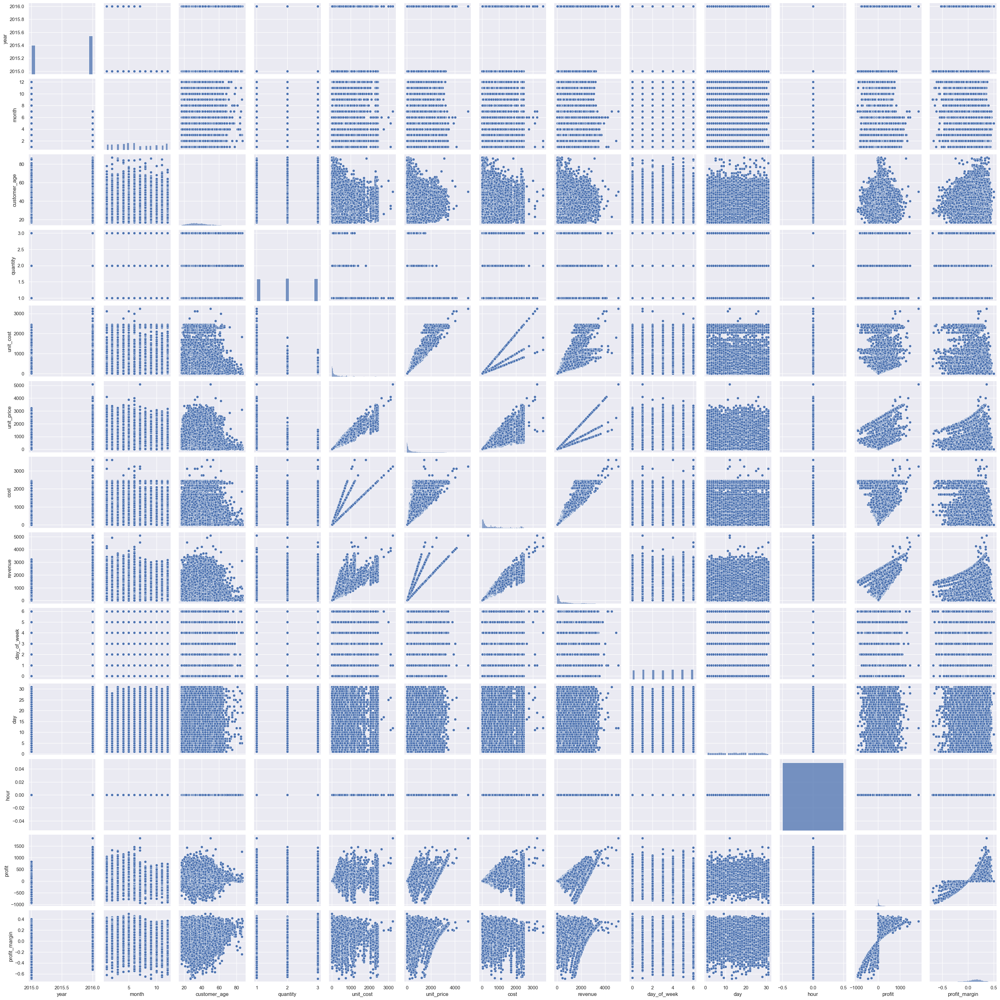

In [57]:
sns.pairplot(data=df_copy)

In [58]:
df_shown=df_copy.drop('hour',axis=1)
fig=px.imshow(df_shown.corr(),text_auto=True)
fig.update_layout(width=1000,height=800)

### Features Selection depending on correlation:

### Depending on above , there is negative correlation between profit and day and month. There is a very low correlation between profit , day_of_week and quantity. So we can drop these features.

In [59]:
from category_encoders import BinaryEncoder

In [60]:
encoder = BinaryEncoder()
encoded_df = encoder.fit_transform(df_copy[['country','product_category','sub_category']])
encoded_df


,country_0,country_1,country_2,product_category_0,product_category_1,sub_category_0,sub_category_1,sub_category_2,sub_category_3,sub_category_4
0,0,0,1,0,1,0,0,0,0,1
1,0,0,1,1,0,0,0,0,1,0
2,0,0,1,0,1,0,0,0,0,1
3,0,0,1,0,1,0,0,0,0,1
4,0,0,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
34861,0,1,0,1,1,0,0,1,0,1
34862,0,1,0,1,1,0,0,1,0,1
34863,0,1,0,1,1,0,0,1,0,1
34864,0,1,0,1,1,0,0,1,0,1


In [81]:
df_copy_encoded=pd.concat([df_copy,encoded_df],axis=1)
df_copy_encoded[df_copy['sub_category'] == 'Bike Racks']

,date,year,month,customer_age,customer_gender,country,state,product_category,sub_category,quantity,...,country_0,country_1,country_2,product_category_0,product_category_1,sub_category_0,sub_category_1,sub_category_2,sub_category_3,sub_category_4
203,2016-03-27,2016.0,3,51.0,M,United States,Oregon,Accessories,Bike Racks,3.0,...,0,0,1,0,1,1,0,0,0,0
547,2016-03-31,2016.0,3,43.0,F,United States,California,Accessories,Bike Racks,2.0,...,0,0,1,0,1,1,0,0,0,0
1631,2016-03-04,2016.0,3,38.0,F,United States,California,Accessories,Bike Racks,2.0,...,0,0,1,0,1,1,0,0,0,0
1632,2016-05-30,2016.0,5,38.0,F,United States,California,Accessories,Bike Racks,1.0,...,0,0,1,0,1,1,0,0,0,0
1633,2016-06-28,2016.0,6,38.0,F,United States,California,Accessories,Bike Racks,3.0,...,0,0,1,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34117,2016-02-04,2016.0,2,48.0,M,United States,Oregon,Accessories,Bike Racks,3.0,...,0,0,1,0,1,1,0,0,0,0
34118,2016-05-22,2016.0,5,48.0,M,United States,Oregon,Accessories,Bike Racks,2.0,...,0,0,1,0,1,1,0,0,0,0
34385,2016-02-01,2016.0,2,41.0,M,United States,California,Accessories,Bike Racks,2.0,...,0,0,1,0,1,1,0,0,0,0
34386,2016-06-03,2016.0,6,41.0,M,United States,California,Accessories,Bike Racks,1.0,...,0,0,1,0,1,1,0,0,0,0


In [82]:
df_copy_encoded=pd.get_dummies(df_copy_encoded, columns=['customer_gender'], drop_first=True)

In [83]:
df_copy_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34823 entries, 0 to 34865
Data columns (total 36 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   date                34823 non-null  datetime64[ns]
 1   year                34823 non-null  float64       
 2   month               34823 non-null  int64         
 3   customer_age        34823 non-null  float64       
 4   country             34823 non-null  object        
 5   state               34823 non-null  object        
 6   product_category    34823 non-null  object        
 7   sub_category        34823 non-null  object        
 8   quantity            34823 non-null  float64       
 9   unit_cost           34823 non-null  float64       
 10  unit_price          34823 non-null  float64       
 11  cost                34823 non-null  float64       
 12  revenue             34823 non-null  float64       
 13  day_name            34823 non-null  object    

In [84]:
df_copy_encoded.drop(['country','state','product_category','sub_category','season','quantity','month_name','day_name','day_of_week','date','month','day','month_string','year_string'],axis=1,inplace=True)

In [87]:
df_copy_encoded.drop('year_month',axis=1,inplace=True)

In [91]:
df_copy_encoded.drop('period',axis=1,inplace=True)

In [88]:
df_copy_encoded.head()

,year,customer_age,unit_cost,unit_price,cost,revenue,hour,period,profit,profit_margin,...,country_1,country_2,product_category_0,product_category_1,sub_category_0,sub_category_1,sub_category_2,sub_category_3,sub_category_4,customer_gender_M
0,2016.0,29.0,80.00,109.000000,80.0,109.0,0,Night (00-5),29.0,0.266055,...,0,1,0,1,0,0,0,0,1,0
1,2016.0,29.0,24.50,28.500000,49.0,57.0,0,Night (00-5),8.0,0.140351,...,0,1,1,0,0,0,0,1,0,0
2,2016.0,29.0,3.67,5.000000,11.0,15.0,0,Night (00-5),4.0,0.266667,...,0,1,0,1,0,0,0,0,1,0
3,2016.0,29.0,87.50,116.500000,175.0,233.0,0,Night (00-5),58.0,0.248927,...,0,1,0,1,0,0,0,0,1,0
4,2016.0,29.0,35.00,41.666667,105.0,125.0,0,Night (00-5),20.0,0.160000,...,0,1,0,1,0,0,0,0,1,0


In [92]:
df_copy_encoded.columns

Index(['year', 'customer_age', 'unit_cost', 'unit_price', 'cost', 'revenue',
       'hour', 'profit', 'profit_margin', 'country_0', 'country_1',
       'country_2', 'product_category_0', 'product_category_1',
       'sub_category_0', 'sub_category_1', 'sub_category_2', 'sub_category_3',
       'sub_category_4', 'customer_gender_M'],
      dtype='object')

In [107]:
df_copy_encoded.to_csv('../data/processed/df_copy_encoded.csv',index=False)